In [2]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.3/709.3 kB 14.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import SAM
from ultralytics.models.sam import Predictor as SAMPredictor
from ultralytics import YOLO
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import numpy as np
import torch
import sys
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


print(f'{ultralytics.__version__ = }')
model = SAM('sam_b.pt')

# ultralytics.__version__ = '8.0.221'

from google.colab import drive
drive.mount('/content/drive')

ultralytics.__version__ = '8.1.9'


100%|██████████| 358M/358M [00:01<00:00, 310MB/s]


Mounted at /content/drive


Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Results saved to runs/segment/predict2
figsize_inch=(7.88, 8.0)


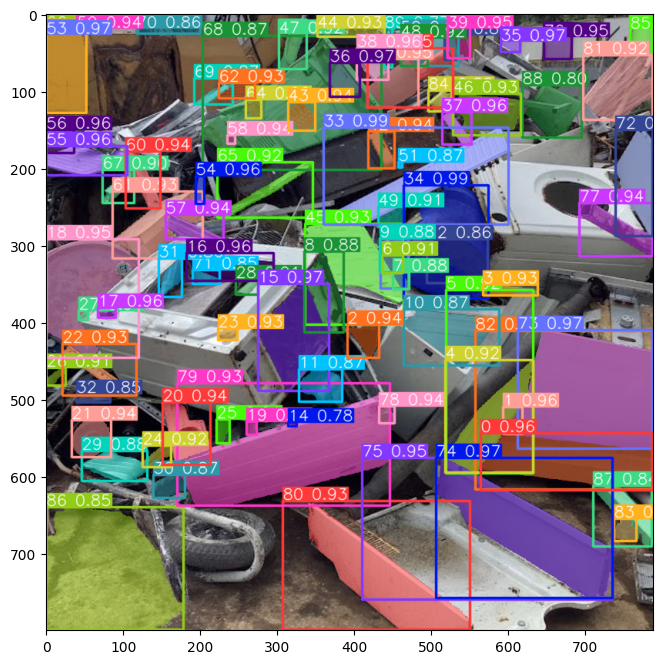

In [9]:
img_path = '/content/drive/MyDrive/dataset/лом(нов)/image_378.jpeg'
img = Image.open(img_path)
best_size = round(max(img.size)/32)*32

# предсказание
overrides = dict(
    task='segment',
    mode='predict',
    imgsz=best_size,
    model='sam_b.pt',
    show_labels=False,
    show_conf=False,
    show_boxes=False,
    # show = True, # не работает в colab, буду рисовать сам через cv2_imshow(img)
    verbose = False,
    )
predictor = SAMPredictor(overrides=overrides)
sam_res = predictor(
    source = img_path,
    conf_thres = 0.05,
    crop_n_layers = 1,
    points_stride=10
)

# Show the results
dpi = plt.rcParams['figure.dpi']

for r in sam_res:
    sam_img = r.plot()  # BGR numpy array of predictions

    # рассчитаем реальные размеры в дюймах используя размер картинки в пикселях и число пикселей на дюйм:
    height, width, _ = sam_img.shape
    figsize_inch = width / float(dpi), height / float(dpi)
    print(f'{figsize_inch=}')

    plt.figure(figsize=figsize_inch)
    sam_img = sam_img[:,:,::-1]
    plt.imshow(sam_img)
    plt.show()

In [ ]:
sys.path.append("..")
# загружаем YOLOv8 
model = YOLO('yolov8n.pt')


results = model.predict(source='/content/drive/MyDrive/dataset/лом(нов)/image_378.jpeg', conf=0.25)

100%|██████████| 6.23M/6.23M [00:00<00:00, 215MB/s]



image 1/1 /content/drive/MyDrive/dataset/лом(нов)/image_378.jpeg: 640x640 (no detections), 14.6ms
Speed: 7.5ms preprocess, 14.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


In [8]:
for result in results:
    boxes = result.boxes
bbox = boxes.xyxy.tolist()

In [13]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [14]:
image = cv2.imread('/content/drive/MyDrive/dataset/лом(нов)/image_378.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

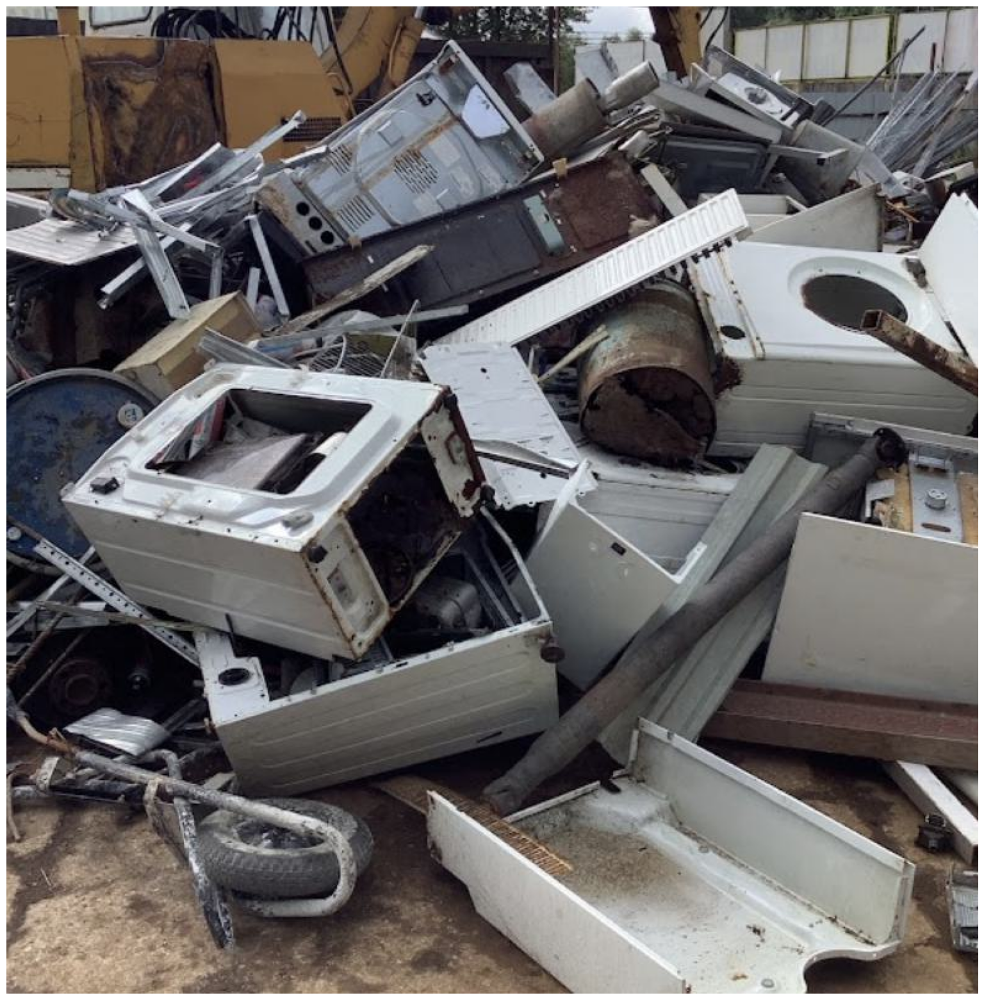

In [15]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:


sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

In [17]:
masks = mask_generator.generate(image)

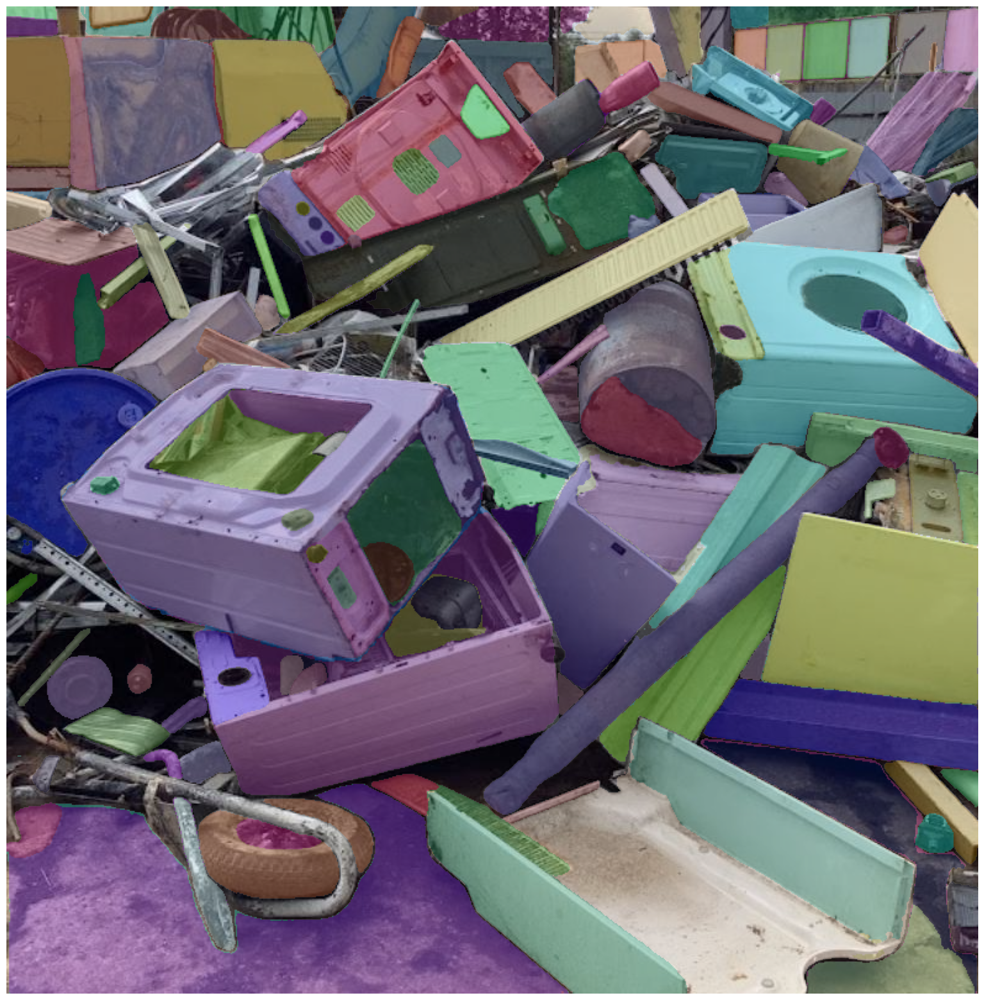

In [18]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

In [73]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=30,
    pred_iou_thresh=0.95,
    stability_score_thresh=0.95,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=10,  #
)

In [74]:
masks2 = mask_generator_2.generate(image)

In [76]:
len(masks2)

113

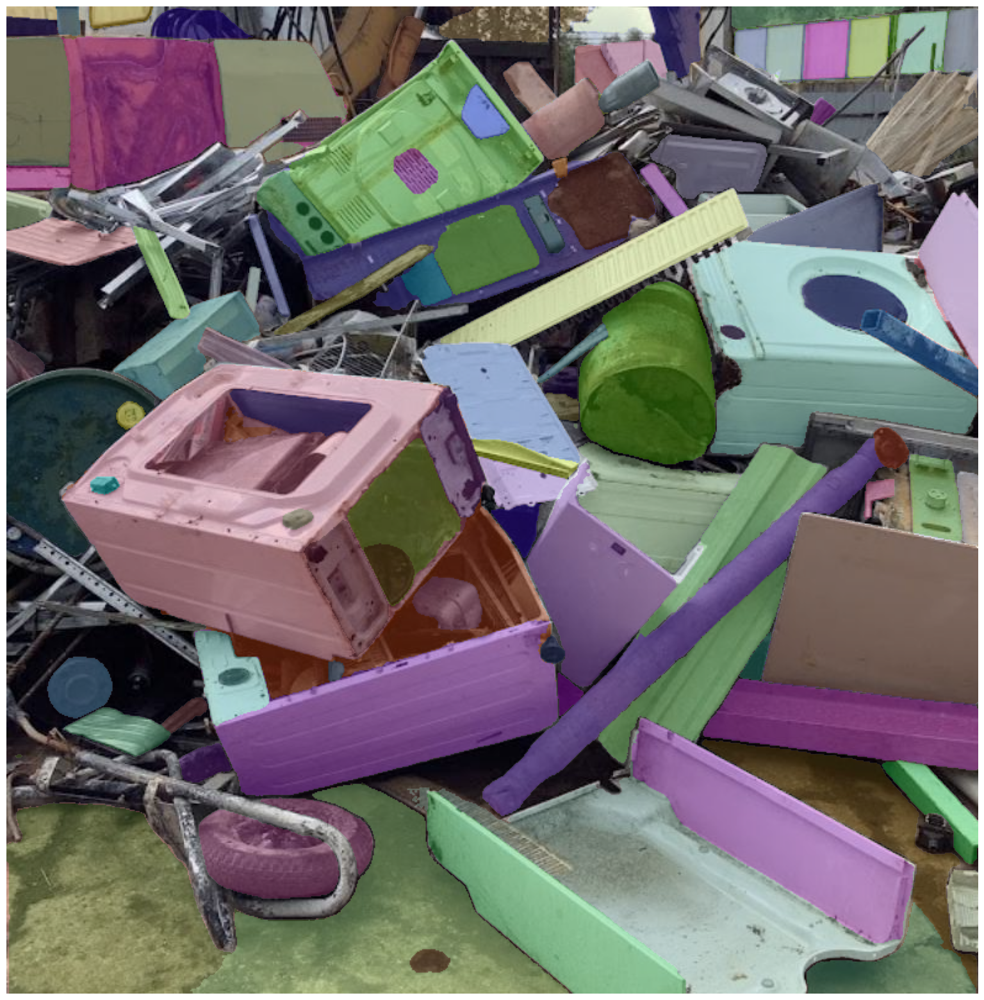

In [77]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()